In [2]:
from skimage.color import rgb2gray
from skimage.filters import gaussian
from skimage.segmentation import active_contour
import numpy as np
import matplotlib.pyplot as plt
import mahotas
import mahotas.demos
import cv2

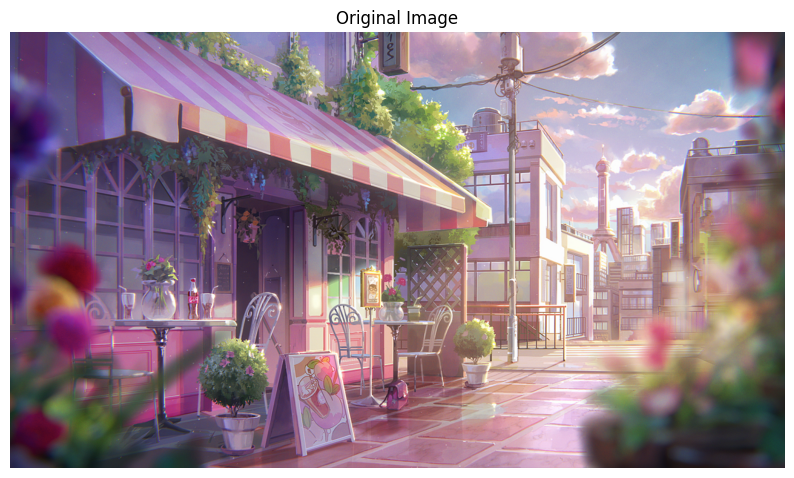

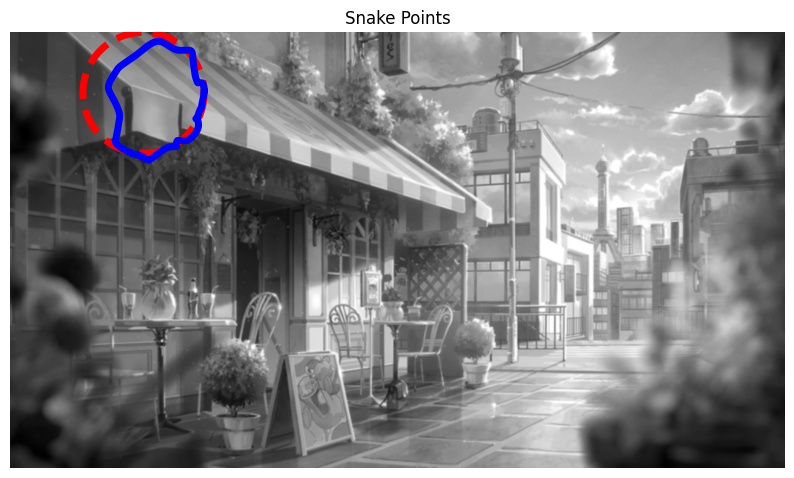

In [2]:
img = plt.imread('View2.jpg')

gray_img = rgb2gray(img)

gray_img_noiseless = gaussian(gray_img, 1)

x1 = 220 + 100*np.cos(np.linspace(0, 2*np.pi, 500))
x2 = 100 + 100*np.sin(np.linspace(0, 2*np.pi, 500))
snake = np.array([x1, x2]).T

img_snake = active_contour(gray_img_noiseless, snake)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.axis('off')
plt.title("Original Image")

plt.figure(figsize=(10, 10))
plt.imshow(gray_img_noiseless, cmap='gray')
plt.plot(snake[:, 0], snake[:, 1], '--r', lw=5)
plt.plot(img_snake[:, 0], img_snake[:, 1], '-b', lw=5)
plt.axis('off')
plt.title("Snake Points")
plt.show()

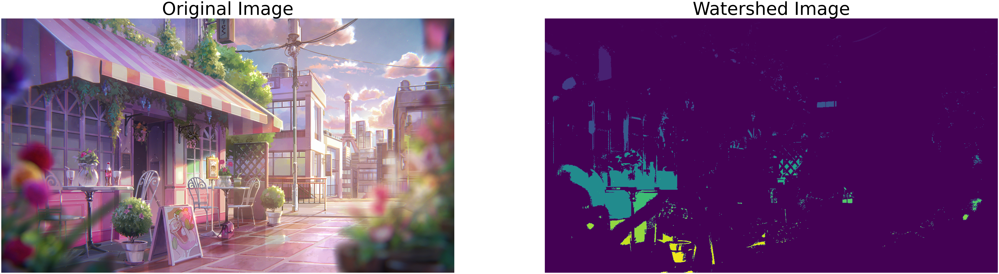

In [12]:
img = plt.imread('View2.jpg')
original_image=img.copy()
img = img.max(2)

T_otsu = mahotas.otsu(img)  

img = img > T_otsu
   
marker, n_nucleus = mahotas.label(img)
new_img = mahotas.cwatershed(img, marker)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(100, 100), sharex=True, sharey=True)
ax1.imshow(original_image)
ax1.axis('off')
ax1.set_title('Original Image',fontsize=100)

ax2.axis('off')
ax2.set_title('Watershed Image',fontsize=100)
ax2.imshow(new_img)

Text(0.5, 1.0, 'K Means Image')

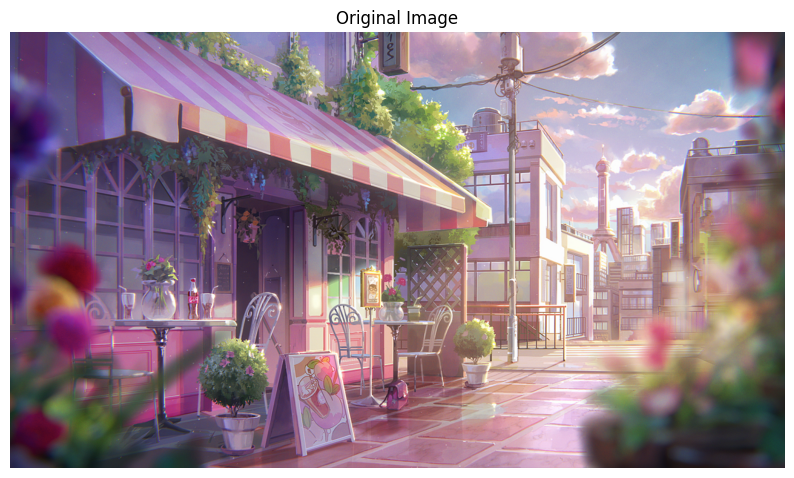

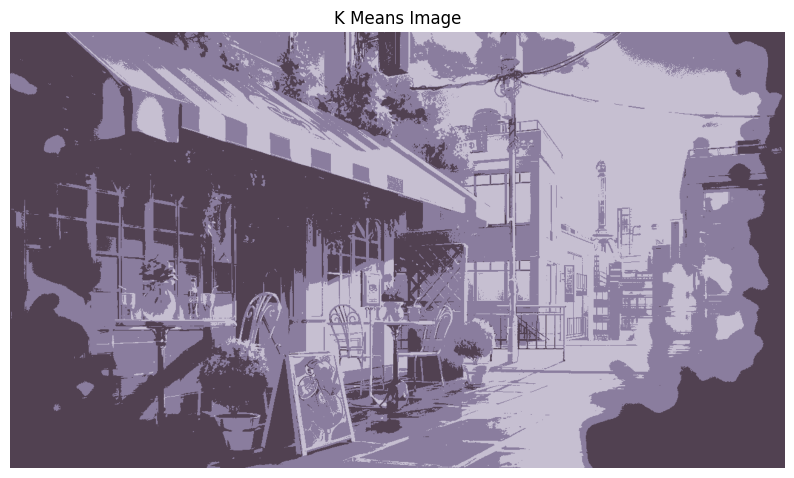

In [10]:
image = plt.imread('View2.jpg')
original_image=image.copy()
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 10))
plt.axis('off') 
plt.imshow(original_image)
plt.title('Original Image')

pixel_vals = image.reshape((-1,3))

pixel_vals = np.float32(pixel_vals)

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.85)

k = 3
retval, labels, centers = cv2.kmeans(pixel_vals, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

centers = np.uint8(centers)
segmented_data = centers[labels.flatten()]

segmented_image = segmented_data.reshape((image.shape))
plt.figure(figsize=(10, 10))
plt.axis('off')
plt.imshow(segmented_image)
plt.title('K Means Image')


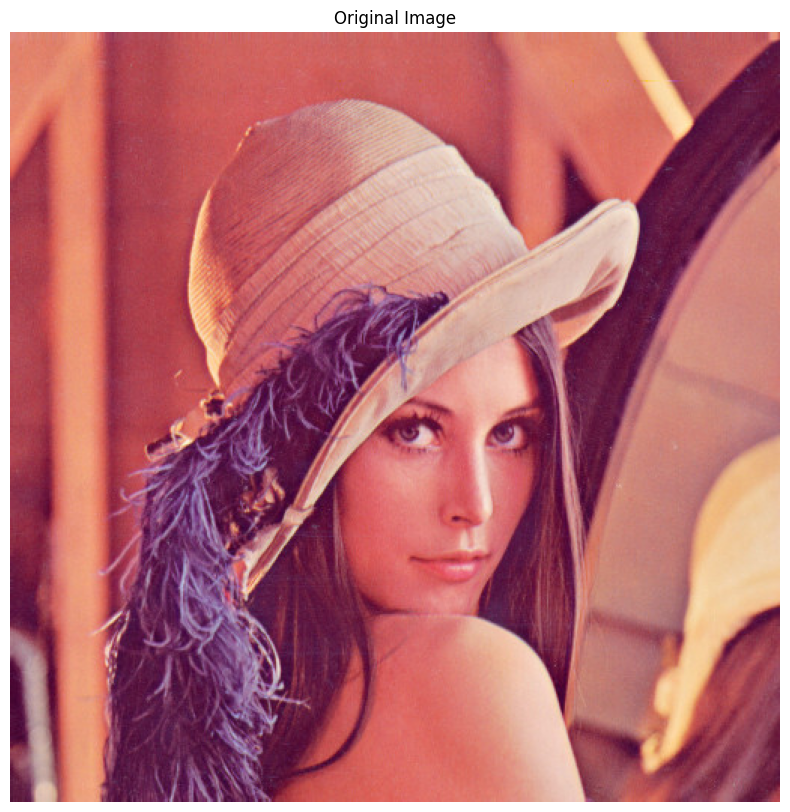

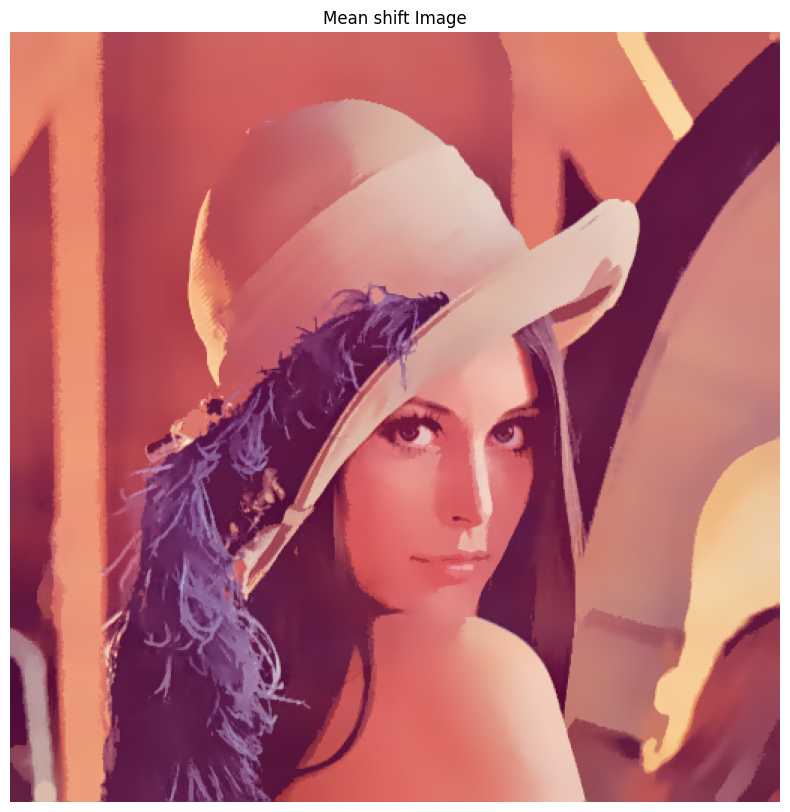

In [44]:
original_image = cv2.imread("g.jpg")

spatial_radius = 10
color_radius = 30
segmented_image = cv2.pyrMeanShiftFiltering(original_image, spatial_radius, color_radius)
plt.figure(figsize=(10, 10))
plt.axis('off')
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

plt.figure(figsize=(10, 10))
plt.axis('off')
plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
plt.title("Mean shift Image")

plt.show()